# Introduction and Problem Statement

## Background and Motivations
Brain tumors are one of the most lethal forms of cancer, and early detection is critical for effective treatment. MRI imaging is a non-invasive technique used to diagnose brain tumors. The objective of this project is to develop a machine learning model to classify MRI images into four categories: glioma, meningioma, pituitary tumor, and no tumor. 

## Problem Statement
The task is to correctly classify MRI images into the four mentioned categories using deep learning techniques, specifically the Inception-V3 model. 

## Project Objectives
- Develop a deep learning model using Inception-V3 to classify MRI images.
- Perform exploratory data analysis to understand the dataset.
- Preprocess the data to ensure it is suitable for training.
- Train and evaluate the model.
- Discuss the strengths and weaknesses of the model.
- Provide insights and future directions for the project.

In [43]:
# Install the tree utility using Homebrew, Set up Environment & install pynml
!brew install tree
!pip install numpy pandas matplotlib seaborn plotly tensorflow pillow scikit-learn
!pip install pynvml
!pip install lime


==> Downloading https://formulae.brew.sh/api/formula.jws.json
######################################################################### 100.0%
==> Downloading https://formulae.brew.sh/api/cask.jws.json
######################################################################### 100.0%
To reinstall 2.1.1_1, run:
  brew reinstall tree


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 24.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.5/313.5 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 27.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 19.9 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=2bf1ef87335db754651549c5657ef69c28352314fe84da6cb10ffb06e3092321
  Stored in directory: /Users/halimsmacbookairm1/Library/Caches/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [44]:
import sys
import os
import math
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import rcParams
rcParams['figure.dpi'] = 300
%matplotlib inline
import seaborn as sns
import missingno as msno
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import *
from PIL import Image, ImageEnhance
from tensorflow.keras.preprocessing.image import *
import subprocess
import hashlib
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import matplotlib.pyplot as plt
from PIL import Image
from keras.preprocessing import image
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.applications.inception_v3 import preprocess_input

print(f'Tensorflow Version: {tf.__version__}.')

Tensorflow Version: 2.16.1.


In [3]:
%%bash
RED_COLOR='\033[0;31m'
NO_COLOR='\033[0m'
pkg_name=tree

if ! command -v $pkg_name &> /dev/null
then
    echo "Installing tree utility..."
    if command -v brew &> /dev/null
    then
        brew install $pkg_name
        if [ "$?" -eq "0" ]
        then
            echo -e ${RED_COLOR}"tree utility installed successfully.\n"${NO_COLOR}
        fi
    else
        echo "Homebrew not found. Please install Homebrew first."
    fi
else
    echo "tree utility is already installed."
fi

tree --version

tree utility is already installed.
tree v2.1.1 © 1996 - 2023 by Steve Baker, Thomas Moore, Francesc Rocher, Florian Sesser, Kyosuke Tokoro


In [4]:
# Define the paths
ROOT_DIR = r"/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim"
DATA_ROOT_DIR = os.path.join(ROOT_DIR, "dataset_26")
TRAIN_DIR = DATA_ROOT_DIR

TUMOR_CLASSES = ['meningioma', 'glioma', 'pituitary', 'notumor']
IMAGE_DATA_PATHS = [os.path.join(TRAIN_DIR, tumor_class) for tumor_class in TUMOR_CLASSES]

# Verify paths
def verify_paths():
    paths = [ROOT_DIR, DATA_ROOT_DIR, TRAIN_DIR] + IMAGE_DATA_PATHS
    for path in paths:
        if os.path.isdir(path):
            print(f"Path exists: {path}")
        else:
            print(f"Path does not exist: {path}")

verify_paths()

# Print out the paths to confirm they are correct
print(f"ROOT_DIR: {ROOT_DIR}")
print(f"DATA_ROOT_DIR: {DATA_ROOT_DIR}")
print(f"TRAIN_DIR: {TRAIN_DIR}")
print(f"IMAGE_DATA_PATHS: {IMAGE_DATA_PATHS}")

Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/meningioma
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/glioma
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary
Path exists: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor
ROOT_DIR: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-

In [5]:
def get_os_version():
    try:
        result = subprocess.run(['sw_vers'], capture_output=True, text=True)
        print("OS Version & Details:")
        print(result.stdout)
    except FileNotFoundError:
        print("sw_vers command not found. This script is designed for macOS.")

get_os_version()

OS Version & Details:
ProductName:		macOS
ProductVersion:		14.5
BuildVersion:		23F79



In [6]:
!tree -d "/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification"

/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification
├── dataset_26
│   ├── glioma
│   ├── meningioma
│   ├── notumor
│   └── pituitary
└── research
    ├── Halim
    │   ├── Archive
    │   └── dataset_26
    │       ├── glioma
    │       ├── meningioma
    │       ├── notumor
    │       └── pituitary
    └── mirza

15 directories


In [7]:
# Step 2: Remove duplicate images
def remove_duplicates(image_folder):
    hash_keys = dict()
    duplicates = []

    for root, dirs, files in os.walk(image_folder):
        for filename in files:
            if filename.endswith(".png") or filename.endswith(".jpg"):
                filepath = os.path.join(root, filename)
                try:
                    with Image.open(filepath) as img:
                        img_hash = hashlib.md5(img.tobytes()).hexdigest()
                        if img_hash not in hash_keys:
                            hash_keys[img_hash] = filename
                        else:
                            duplicates.append(filepath)
                except Exception as e:
                    print(f"Error processing file {filepath}: {e}")

    for duplicate in duplicates:
        os.remove(duplicate)

    return duplicates

# Example usage
duplicates = remove_duplicates(DATA_ROOT_DIR)
duplicates_count = len(duplicates)
print(f"Removed {duplicates_count} duplicate images.")
print("List of removed duplicate images:")
for dup in duplicates:
    print(dup)

# Optionally, save the list of removed duplicates to a file
log_file_path = os.path.join(ROOT_DIR, "removed_duplicates_log.txt")
with open(log_file_path, 'w') as log_file:
    log_file.write(f"Removed {duplicates_count} duplicate images.\n")
    log_file.write("List of removed duplicate images:\n")
    for dup in duplicates:
        log_file.write(f"{dup}\n")

Removed 20 duplicate images.
List of removed duplicate images:
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0011(1).jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0320.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Tr-no_0325.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Te-no_0067.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Tr-no_0341.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/notumor/Tr-no_0234.jpg
/Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/resear

Resized all images to 224x224.
Sample of resized images:
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0075.jpg, Original Size: (512, 512), New Size: (224, 224)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0049.jpg, Original Size: (512, 512), New Size: (224, 224)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Te-pi_0019.jpg, Original Size: (512, 512), New Size: (224, 224)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Te-pi_0031.jpg, Original Size: (512, 512), New Size: (224, 224)
File: /Users/halimsmacbookairm1/Documents/GitHub/csc3107-group26-p3-ml-brain-mri-classification/research/Halim/dataset_26/pituitary/Tr-pi_0101.jpg, Original Si

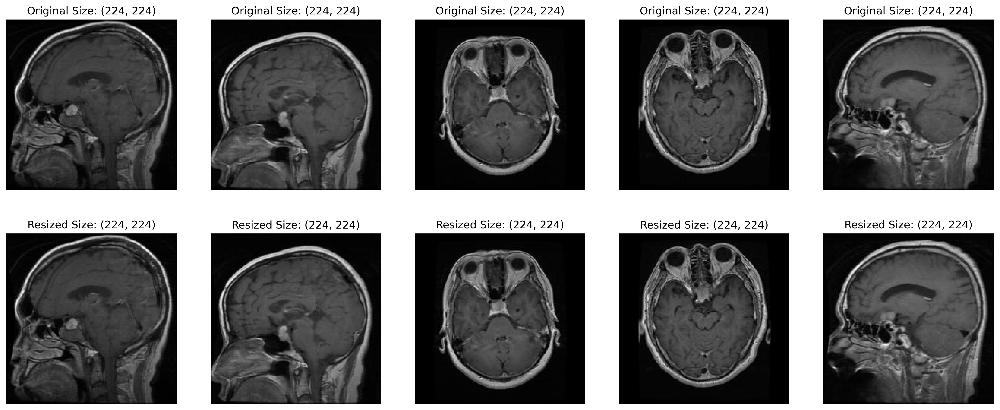

In [8]:
# Step 3: Normalize image shapes
def resize_images(image_folder, target_size=(224, 224), log_file="resize_log.txt"):
    resize_log = []
    for root, dirs, files in os.walk(image_folder):
        for filename in files:
            if filename.endswith(".png") or filename.endswith(".jpg"):
                filepath = os.path.join(root, filename)
                with Image.open(filepath) as img:
                    original_size = img.size
                    img_resized = img.resize(target_size)
                    img_resized.save(filepath)
                    resize_log.append((filepath, original_size, img_resized.size))

    # Save log to file
    with open(log_file, 'w') as log:
        log.write("Resized Images Log\n")
        log.write("Filepath\tOriginal Size\tNew Size\n")
        for entry in resize_log:
            log.write(f"{entry[0]}\t{entry[1]}\t{entry[2]}\n")

    return resize_log

# Example usage
resize_log = resize_images(DATA_ROOT_DIR)
print("Resized all images to 224x224.")
print("Sample of resized images:")
for entry in resize_log[:5]:  # Show first 5 entries as proof
    print(f"File: {entry[0]}, Original Size: {entry[1]}, New Size: {entry[2]}")

# Display a few images before and after resizing
def display_image_comparison(image_paths, target_size=(224, 224)):
    fig, axes = plt.subplots(2, len(image_paths), figsize=(20, 8))
    for i, image_path in enumerate(image_paths):
        with Image.open(image_path) as img:
            axes[0, i].imshow(img)
            axes[0, i].set_title(f"Original Size: {img.size}")
            axes[0, i].axis('off')
            img_resized = img.resize(target_size)
            axes[1, i].imshow(img_resized)
            axes[1, i].set_title(f"Resized Size: {img_resized.size}")
            axes[1, i].axis('off')
    plt.show()

# Select a few images to display as proof
sample_image_paths = [entry[0] for entry in resize_log[:5]]  # Use first 5 entries for display
display_image_comparison(sample_image_paths)

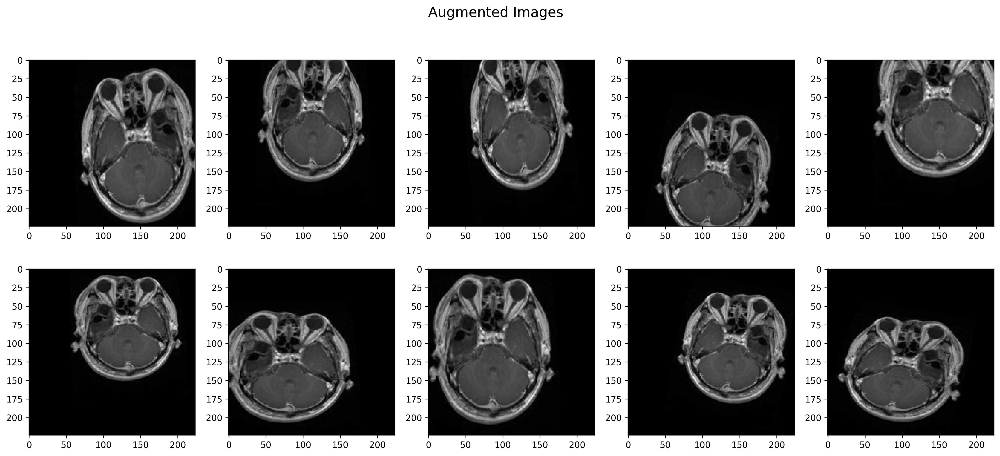

In [9]:
# Step 4: Data augmentation setup
datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Load a sample image
sample_image_path = os.path.join(DATA_ROOT_DIR, 'glioma', 'Te-gl_0011.jpg')
sample_image = load_img(sample_image_path)  # This is a PIL image
x = img_to_array(sample_image)  # Numpy array with shape (3, 150, 150)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 3, 150, 150)

# Generate and plot augmented images
i = 0
fig, ax = plt.subplots(2, 5, figsize=(20, 8))
for batch in datagen.flow(x, batch_size=1):
    ax[i // 5, i % 5].imshow(array_to_img(batch[0]))
    i += 1
    if i % 10 == 0:
        break

plt.suptitle("Augmented Images", fontsize=16)
plt.show()

Data shape: (460, 224, 224, 3), Labels shape: (460,)
Sample of loaded images and labels:
Image shape: (224, 224, 3), Label: 0
Image shape: (224, 224, 3), Label: 0
Image shape: (224, 224, 3), Label: 0
Image shape: (224, 224, 3), Label: 0
Image shape: (224, 224, 3), Label: 0


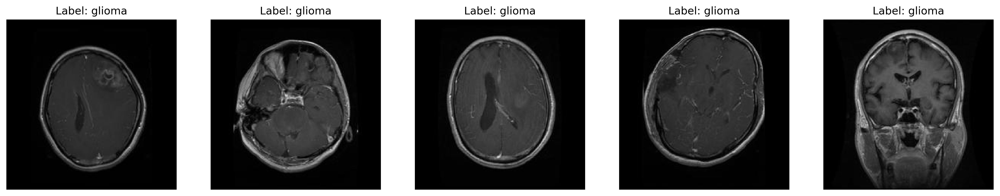

In [10]:
# Step 5: Load and preprocess data
def load_data(image_folder, categories, image_size=(224, 224), log_file="load_data_log.txt"):
    data = []
    labels = []
    load_log = []
    for category in categories:
        folder_path = os.path.join(image_folder, category)
        class_num = categories.index(category)
        for img in os.listdir(folder_path):
            try:
                img_path = os.path.join(folder_path, img)
                img = Image.open(img_path).convert('RGB')  # Ensure all images are RGB
                original_size = img.size
                img = img.resize(image_size)
                img_array = np.array(img)
                data.append(img_array)
                labels.append(class_num)
                load_log.append((img_path, original_size, img_array.shape, class_num))
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")

    # Save log to file
    with open(log_file, 'w') as log:
        log.write("Loaded Images Log\n")
        log.write("Filepath\tOriginal Size\tNew Size\tLabel\n")
        for entry in load_log:
            log.write(f"{entry[0]}\t{entry[1]}\t{entry[2]}\t{entry[3]}\n")

    return np.array(data), np.array(labels)

# Example usage
categories = ['glioma', 'meningioma', 'notumor', 'pituitary']
data, labels = load_data(DATA_ROOT_DIR, categories)
print(f"Data shape: {data.shape}, Labels shape: {labels.shape}")

# Print a sample of loaded data
print("Sample of loaded images and labels:")
for i in range(5):  # Print first 5 entries as proof
    print(f"Image shape: {data[i].shape}, Label: {labels[i]}")

# Display a few loaded images
def display_loaded_images(images, labels, categories, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(20, 4))
    for i in range(num_images):
        axes[i].imshow(images[i])
        axes[i].set_title(f"Label: {categories[labels[i]]}")
        axes[i].axis('off')
    plt.show()

display_loaded_images(data, labels, categories, num_images=5)

In [11]:
# Normalize pixel values
data = data / 255.0

In [12]:
# Split the data
train_data, temp_data, train_labels, temp_labels = train_test_split(data, labels, test_size=0.3, random_state=42)
validation_data, test_data, validation_labels, test_labels = train_test_split(temp_data, temp_labels, test_size=0.5, random_state=42)

# Print the shapes of the datasets
print(f"Training set: {train_data.shape}, Validation set: {validation_data.shape}, Test set: {test_data.shape}")

# Print a summary of the labels in each dataset to ensure proper distribution
def summarize_labels(labels, dataset_name):
    unique, counts = np.unique(labels, return_counts=True)
    label_distribution = dict(zip(unique, counts))
    print(f"{dataset_name} label distribution: {label_distribution}")

summarize_labels(train_labels, "Training set")
summarize_labels(validation_labels, "Validation set")
summarize_labels(test_labels, "Test set")

# Save the splitting log to a file
split_log_file = "split_log.txt"
with open(split_log_file, 'w') as log:
    log.write(f"Training set shape: {train_data.shape}\n")
    log.write(f"Validation set shape: {validation_data.shape}\n")
    log.write(f"Test set shape: {test_data.shape}\n")
    log.write(f"\nTraining set label distribution: {summarize_labels(train_labels, 'Training set')}\n")
    log.write(f"\nValidation set label distribution: {summarize_labels(validation_labels, 'Validation set')}\n")
    log.write(f"\nTest set label distribution: {summarize_labels(test_labels, 'Test set')}\n")

print(f"Splitting log saved to {split_log_file}")

Training set: (322, 224, 224, 3), Validation set: (69, 224, 224, 3), Test set: (69, 224, 224, 3)
Training set label distribution: {0: 71, 1: 86, 2: 84, 3: 81}
Validation set label distribution: {0: 28, 1: 7, 2: 15, 3: 19}
Test set label distribution: {0: 20, 1: 16, 2: 15, 3: 18}
Training set label distribution: {0: 71, 1: 86, 2: 84, 3: 81}
Validation set label distribution: {0: 28, 1: 7, 2: 15, 3: 19}
Test set label distribution: {0: 20, 1: 16, 2: 15, 3: 18}
Splitting log saved to split_log.txt


In [13]:
# Create data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Flow from Numpy arrays
train_image_datagen = train_datagen.flow(train_data, train_labels, batch_size=32)
validation_image_datagen = validation_datagen.flow(validation_data, validation_labels, batch_size=32)
test_image_datagen = test_datagen.flow(test_data, test_labels, batch_size=32)

In [38]:
# Calculate the data distribution count
data_distribution_count = pd.Series(
    [len(os.listdir(path)) for path in IMAGE_DATA_PATHS if os.path.exists(path) and os.path.isdir(path)],
    index=TUMOR_CLASSES
)

data_distribution_count

meningioma    109
glioma        119
pituitary     118
notumor       114
dtype: int64

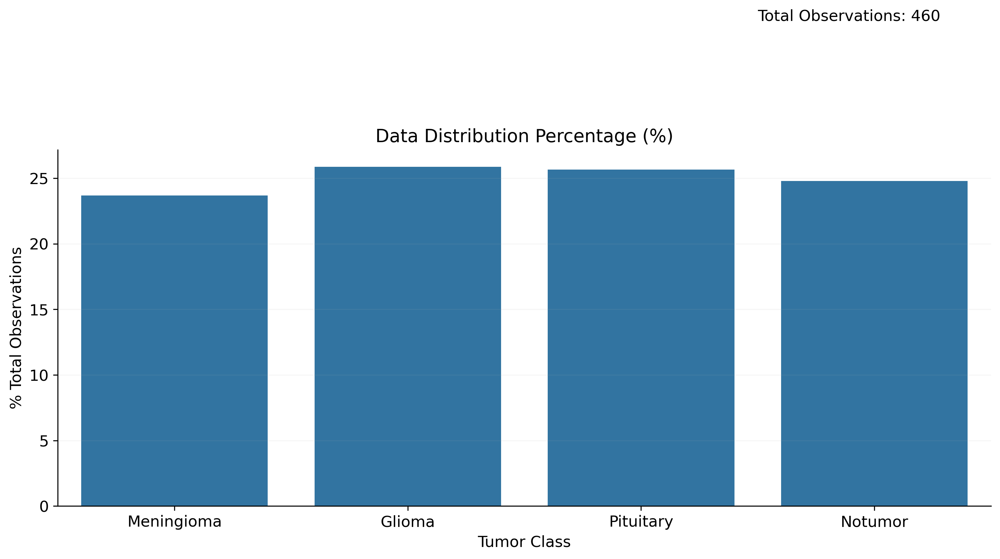

In [39]:
# Data Distribution Visualization
fig, axis = plt.subplots(figsize=(13, 5))
axis.grid(True, alpha=0.1)
axis.set_title("Data Distribution Percentage (%)", fontsize=14)
sns.barplot(x=['\n'.join(curr_index.strip().split('_')).title() for curr_index in data_distribution_count.index],
            y=100 * (data_distribution_count / data_distribution_count.sum()), ax=axis)
axis.set_xlabel("Tumor Class", fontsize=12)
axis.set_ylabel("% Total Observations", fontsize=12)
axis.tick_params(which='major', labelsize=12)
axis.text(2.5, 37, f'Total Observations: {data_distribution_count.sum()}', fontdict=dict(size=12))
sns.despine()

plt.show()

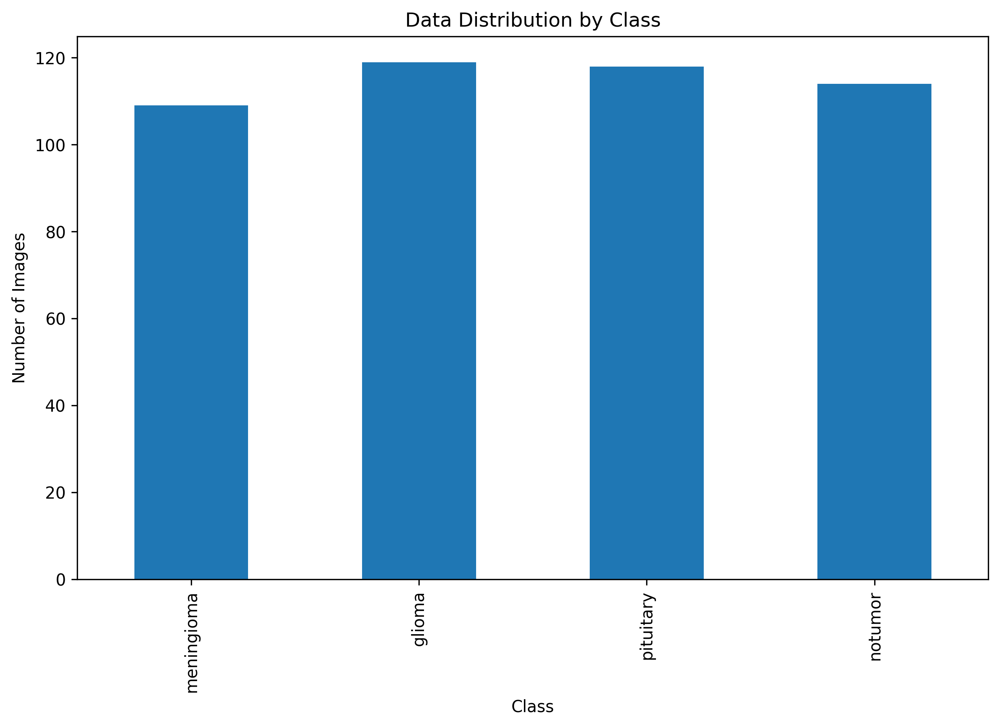

Data Distribution by Class:
meningioma: 109 images
glioma: 119 images
pituitary: 118 images
notumor: 114 images


In [14]:
# Data distribution visualization
data_distribution_count = pd.Series([len(os.listdir(path)) for path in IMAGE_DATA_PATHS], index=TUMOR_CLASSES)
data_distribution_count.plot(kind='bar', figsize=(10, 6), title="Data Distribution by Class")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.show()

print("Data Distribution by Class:")
for tumor_class, count in data_distribution_count.items():
    print(f"{tumor_class}: {count} images")

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


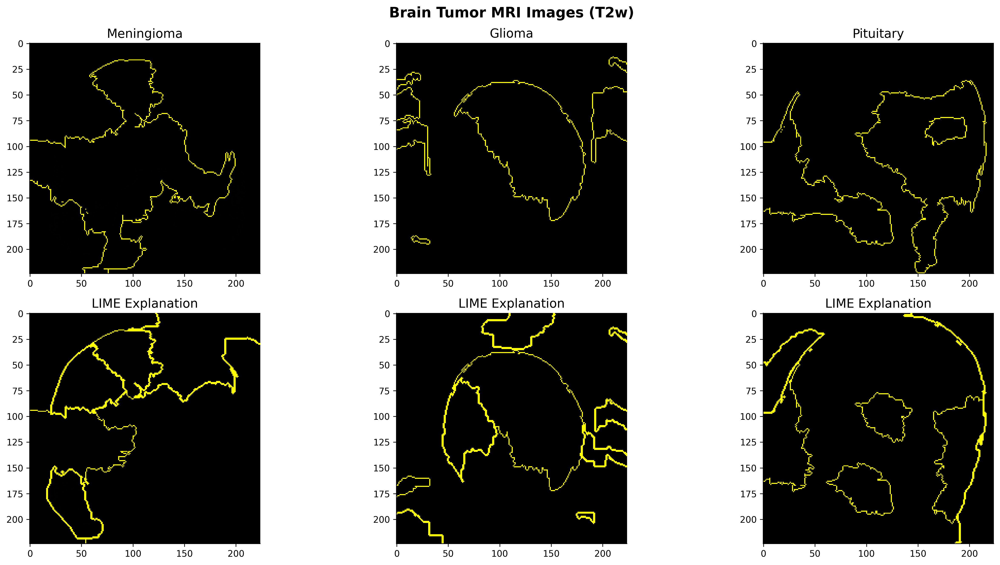

In [45]:
# Function to preprocess the image
def preprocess_img(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

# Define the explainer
explainer = lime_image.LimeImageExplainer()

BRIGHTNESS_FACTOR = 1.7
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 9))
axes = axes.flatten()
fig.suptitle("Brain Tumor MRI Images (T2w)", fontsize=16, fontweight='bold')

for curr_title, filename, curr_axis in zip(TUMOR_CLASSES[:-1], IMAGE_DATA_PATHS[:-1], axes[:3]):
    img_path = os.path.join(filename, os.listdir(filename)[0])
    img = preprocess_img(img_path)
    
    # Generate explanation
    explanation = explainer.explain_instance(img[0], inception_cnn_model.predict, top_labels=1, hide_color=0, num_samples=1000)
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=False)
    
    curr_axis.imshow(mark_boundaries(temp / 255.0, mask))
    curr_axis.set_title(" ".join(curr_title.split('_')).title(), fontsize=14)

# LIME explanations for the masks
for curr_title, filename, curr_axis in zip(TUMOR_CLASSES[:-1], IMAGE_DATA_PATHS[:-1], axes[3:]):
    img_path = os.path.join(filename, os.listdir(filename)[0])
    img = preprocess_img(img_path)
    
    # Generate explanation
    explanation = explainer.explain_instance(img[0], inception_cnn_model.predict, top_labels=1, hide_color=0, num_samples=1000)
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=True)
    
    curr_axis.imshow(mark_boundaries(temp / 255.0, mask))
    curr_axis.set_title("LIME Explanation", fontsize=14)

fig.tight_layout()
sns.despine()
plt.show()

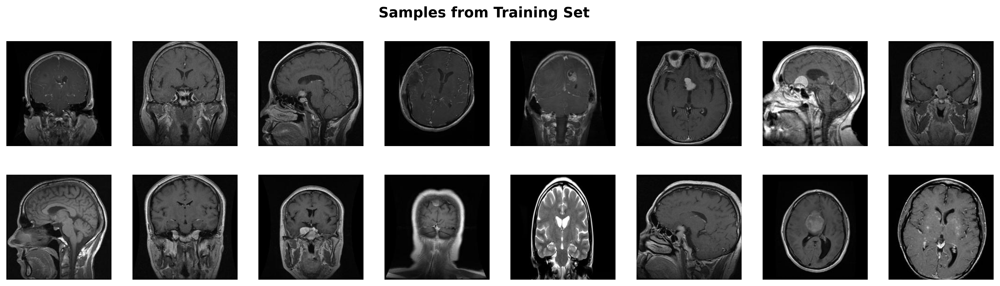

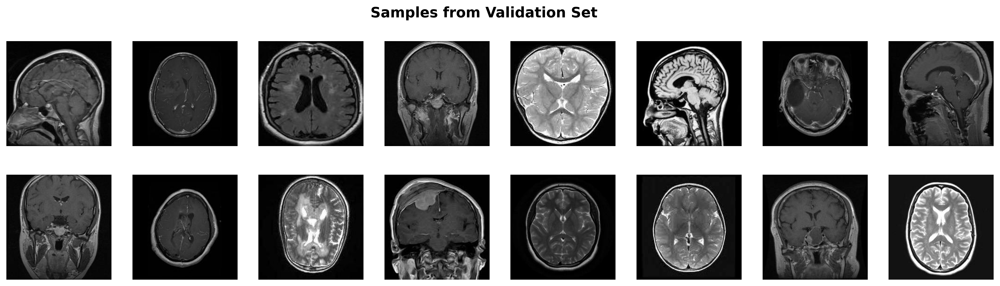

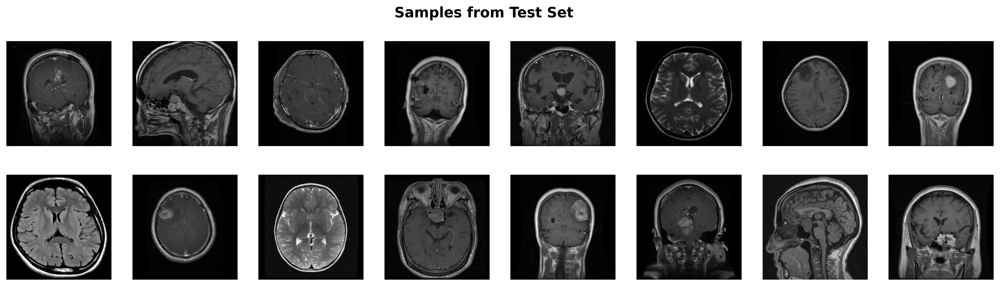

In [46]:
# Visualize some samples from the datasets
def visualize_samples(dataset, title):
    fig, axes = plt.subplots(nrows=2, ncols=8, figsize=(20, 5))
    fig.suptitle(title, fontsize=16, fontweight='bold')
    for curr_axis, curr_image in zip(axes.flatten(), dataset[:16]):
        curr_axis.imshow(tf.squeeze(curr_image), cmap='gray')
        curr_axis.axis('off')
    plt.show()

visualize_samples(train_data, "Samples from Training Set")
visualize_samples(validation_data, "Samples from Validation Set")
visualize_samples(test_data, "Samples from Test Set")

In [20]:
# Define the InceptionV3 model
inception_v3_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3), pooling='avg')
inception_v3_model.trainable = False  # Freeze the base model

inception_cnn_model = Sequential()
inception_cnn_model.add(inception_v3_model)
inception_cnn_model.add(Flatten())
inception_cnn_model.add(Dense(1024, activation='relu', name='Hidden-Layer-1'))
inception_cnn_model.add(Dense(len(TUMOR_CLASSES), activation='softmax', name='Output-Layer'))
inception_cnn_model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
inception_cnn_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ ?                      │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Hidden-Layer-1 (Dense)          │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output-Layer (Dense)            │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 21,802,784 (83.17 MB)

In [21]:
# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True)

In [26]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

# Train the model
history = inception_cnn_model.fit(
    train_image_datagen,
    validation_data=validation_image_datagen,
    epochs=50,
    callbacks=[early_stopping, model_checkpoint, reduce_lr]
)

# Check if early stopping was triggered
print(f"Training stopped at epoch {len(history.epoch)} due to early stopping.")

Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 703ms/step - accuracy: 0.4269 - loss: 1.2395 - val_accuracy: 0.3913 - val_loss: 1.1879 - learning_rate: 0.0010
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 766ms/step - accuracy: 0.3976 - loss: 1.2959 - val_accuracy: 0.3188 - val_loss: 1.2646 - learning_rate: 0.0010
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 742ms/step - accuracy: 0.4329 - loss: 1.2037 - val_accuracy: 0.2754 - val_loss: 1.2644 - learning_rate: 0.0010
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 739ms/step - accuracy: 0.4258 - loss: 1.2364 - val_accuracy: 0.6377 - val_loss: 0.9520 - learning_rate: 0.0010
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 827ms/step - accuracy: 0.4383 - loss: 1.2977 - val_accuracy: 0.5942 - val_loss: 1.0158 - learning_rate: 0.0010
Training stopped at epoch 5 due to early stopping.


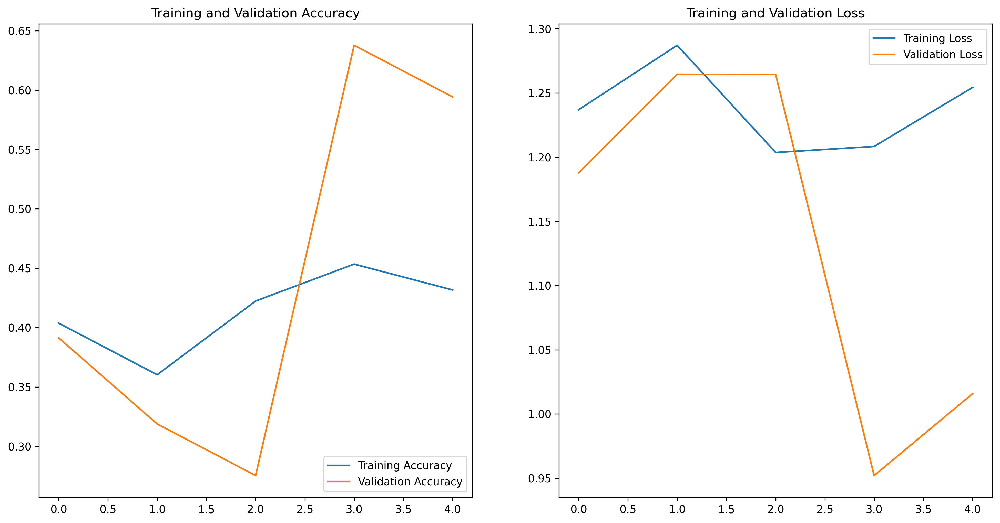

In [27]:
# Plot the training history
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(len(acc))

    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

plot_training_history(history)

In [28]:
# Load the best model
inception_cnn_model.load_weights('best_model.keras')

In [29]:
# Evaluate on test data
test_loss, test_accuracy = inception_cnn_model.evaluate(test_image_datagen)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 367ms/step - accuracy: 0.5271 - loss: 1.1172
Test Accuracy: 50.72%


In [30]:
# Generate classification report
predictions = inception_cnn_model.predict(test_image_datagen)
predicted_labels = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predicted_labels, target_names=TUMOR_CLASSES))

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 666ms/step
              precision    recall  f1-score   support

  meningioma       0.31      0.20      0.24        20
      glioma       0.00      0.00      0.00        16
   pituitary       0.17      0.13      0.15        15
     notumor       0.30      0.72      0.42        18

    accuracy                           0.28        69
   macro avg       0.19      0.26      0.20        69
weighted avg       0.20      0.28      0.21        69



/Users/halimsmacbookairm1/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/halimsmacbookairm1/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/halimsmacbookairm1/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capita

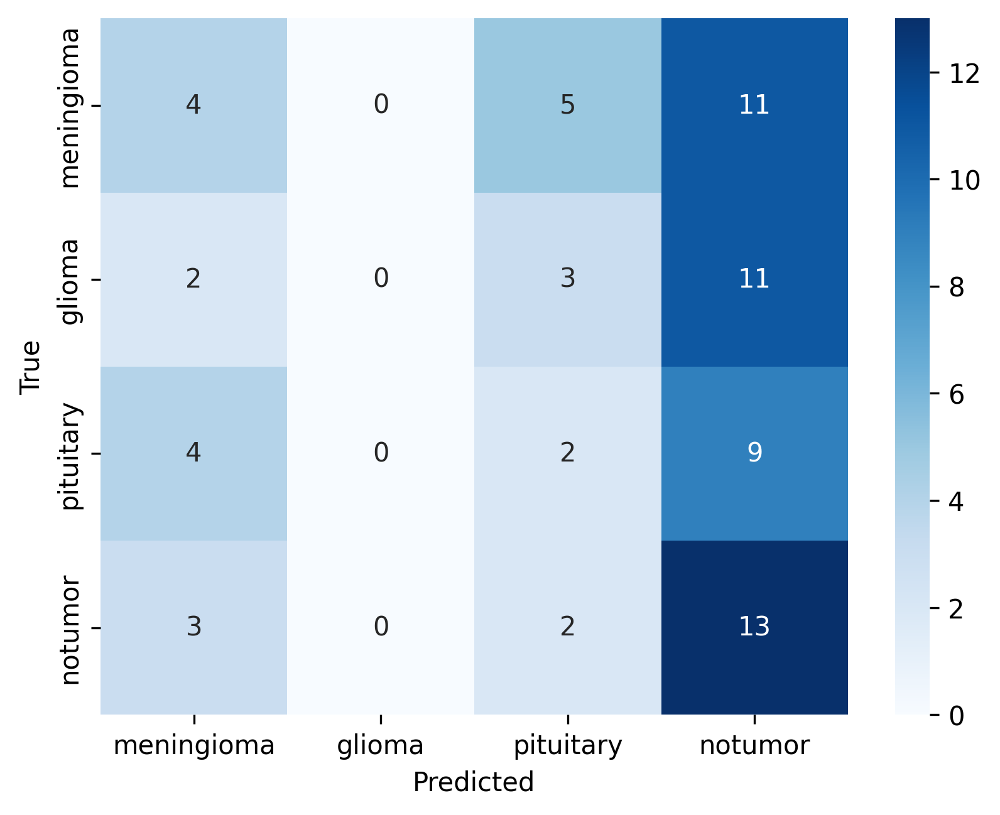

In [31]:
# Confusion matrix
conf_matrix = confusion_matrix(test_labels, predicted_labels)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=TUMOR_CLASSES, yticklabels=TUMOR_CLASSES)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [37]:
def generate_report(model, test_dataset):
    # Evaluate the model on the test data
    test_loss, test_accuracy = model.evaluate(test_dataset)
    
    # Predict the labels on the test data
    predictions = model.predict(test_dataset)
    predicted_labels = np.argmax(predictions, axis=1)
    
    # Generate the classification report
    report = classification_report(test_labels, predicted_labels, target_names=TUMOR_CLASSES, output_dict=True, zero_division=0)
    report_df = pd.DataFrame(report).transpose()
    
    return report_df

# Ensure that test_labels and TUMOR_CLASSES are correctly defined
test_labels = test_image_datagen.classes  # Assuming test_image_datagen is the test data generator
TUMOR_CLASSES = ['meningioma', 'glioma', 'pituitary', 'notumor']

# Generate report
inceptionv3_report_df = generate_report(inception_cnn_model, test_image_datagen)
print(inceptionv3_report_df)

AttributeError: 'NumpyArrayIterator' object has no attribute 'classes'

In [35]:
# Training statistics visualization
training_process_viz(pd.DataFrame(inception_model_train_history.history), plot_title='Inception-V3 Training Statistics')

NameError: name 'training_process_viz' is not defined